In [1]:
import tensorflow as tf
import tools.datasets.mnist3 as mnist_tools
import tools.datasets.svhn as svhn_tools
import tools.semisup as semisup
import numpy as np
import architectures as arch
from functools import partial

import tools.visualization as vis
import tools.updated_semisup as up

%load_ext autoreload
%autoreload 2

/home/frankzl/.envs/env36-ml/.venv/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
mnist_train_images, mnist_train_labels = mnist_tools.get_data('train')
mnist_test_images, mnist_test_labels = mnist_tools.get_data('test')
svhn_train_images, svhn_train_labels = svhn_tools.get_data('train')
svhn_test_images, svhn_test_labels = svhn_tools.get_data('test')

Extracting /home/frankzl/datasets/mnist/train-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist/train-labels-idx1-ubyte.gz
Extracting /home/frankzl/datasets/mnist/t10k-images-idx3-ubyte.gz
Extracting /home/frankzl/datasets/mnist/t10k-labels-idx1-ubyte.gz


In [9]:
mnist_test_images[0].shape

(28, 28, 3)

In [18]:
# labeled samples used per class
# sup_per_class = 10
sup_per_class = -1
sup_seed = -1
# labeled samples per class per batch
sup_per_batch = 100
unsup_batch_size = 1000
unsup_samples = -1

learning_rate = 1e-4
decay_steps = 9000
decay_factor = 0.33
visit_weight = 0.2
logit_weight = 1.0

max_steps = 12000
eval_interval = 500

log_dir = "logs/svhn-mnist/model-svhn-mnist-visit"

seed = None

IMAGE_SHAPE = svhn_tools.IMAGE_SHAPE
NUM_LABELS = svhn_tools.NUM_LABELS

# gets sup_per_class samples for each class


# [10 (classes), 10 (samples), 28, 28, 1]
sup_by_label = semisup.sample_by_label(svhn_train_images, svhn_train_labels,
                        sup_per_class, NUM_LABELS, seed)

In [11]:
svhn_test_images.shape

(26032, 32, 32, 3)

**dataset: SVHN**

**target: MNIST**

In [12]:
visit_weight_evelope = "linear"
visit_weight = 0.2
visit_weight_envelope_steps = 1
visit_weight_envelope_delay = 500

walker_weight_evelope = "linear"
walker_weight = 0.2
walker_weight_envelope_steps = 1
walker_weight_envelope_delay = 500

In [13]:
TARGET_SHAPE = mnist_tools.IMAGE_SHAPE
TEST_SHAPE   = TARGET_SHAPE


image_shape = IMAGE_SHAPE
new_shape   = TARGET_SHAPE
emb_size    = 128

In [14]:
# Sample unlabeled training subset.
if unsup_samples > -1:
    num_unlabeled = len(mnist_train_images)
    assert unsup_samples <= num_unlabeled, (
        'Chose more unlabeled samples ({})'
        ' than there are in the '
        'unlabeled batch ({}).'.format(unsup_samples, num_unlabeled))

    rng = np.random.RandomState(seed=seed)
    choice = rng.choice(num_unlabeled, unsup_samples, False)
    sampled_unsup_images = mnist_train_images[choice]
    sampled_unsup_labels = mnist_train_labels[choice]
else:
    sampled_unsup_images = mnist_train_images
    sampled_unsup_labels = mnist_train_labels

In [15]:
new_shape

[28, 28, 3]

In [16]:
from ipywidgets import IntProgress, Layout
from train import apply_envelope

graph = tf.Graph()


with graph.as_default():
    
    unsup_data = up.create_input(sampled_unsup_images, sampled_unsup_labels, unsup_batch_size)
    unsup_it   = unsup_data.make_initializable_iterator()
    
    t_unsup_images,t_unsup_labels = unsup_it.get_next()
    
    sup_data,sup_label = up.create_per_class_inputs_v2(sup_by_label, sup_per_batch)
    sup_it             = sup_data.repeat().make_one_shot_iterator()
    sup_it_label       = sup_label.repeat().make_one_shot_iterator()
    
    model_func = partial(
        arch.svhn_model,
        new_shape=new_shape,
        img_shape=image_shape,
        emb_size=emb_size
    )
    
    model = semisup.SemisupModel(model_func, NUM_LABELS, IMAGE_SHAPE,
                                 test_in=tf.placeholder(np.float32, [None] + TEST_SHAPE, 'test_in')
                                )
    
    t_sup_images, t_sup_labels = tf.concat( sup_it.get_next(), 0), tf.concat( sup_it_label.get_next(), 0)
    
    t_sup_emb   = model.image_to_embedding(t_sup_images)
    t_unsup_emb = model.image_to_embedding(t_unsup_images)
    
    t_sup_logit = model.embedding_to_logit(t_sup_emb)
    
    visit_weight = apply_envelope(
        type = visit_weight_evelope,
        step = model.step,
        final_weight = visit_weight,
        growing_steps = visit_weight_envelope_steps,
        delay = visit_weight_envelope_delay
    )
    
    walker_weight = apply_envelope(
        type = walker_weight_evelope,
        step = model.step,
        final_weight = walker_weight,
        growing_steps = walker_weight_envelope_steps,
        delay = walker_weight_envelope_delay
    )
    
    tf.summary.scalar("Weights_Visit", visit_weight)
    tf.summary.scalar("Weight_Walker", walker_weight)
    
    model.add_semisup_loss(t_sup_emb, t_unsup_emb, t_sup_labels, visit_weight=visit_weight, walker_weight=walker_weight)
    model.add_logit_loss(t_sup_logit, t_sup_labels, weight=logit_weight)
    
    t_learning_rate = tf.train.exponential_decay(
        learning_rate,
        model.step,
        decay_steps,
        decay_factor,
        staircase = True
    )
    
    train_op = model.create_train_op(t_learning_rate)
    summary_op = tf.summary.merge_all()
    
    summary_writer = tf.summary.FileWriter(log_dir, graph)
    
    saver = tf.train.Saver(max_to_keep=30)

---------
Variables: name (type shape) [size]
---------
net/conv1/weights:0 (float32_ref 3x3x3x32) [864, bytes: 3456]
net/conv1/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv1_2/weights:0 (float32_ref 3x3x32x32) [9216, bytes: 36864]
net/conv1_2/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv1_3/weights:0 (float32_ref 3x3x32x32) [9216, bytes: 36864]
net/conv1_3/biases:0 (float32_ref 32) [32, bytes: 128]
net/conv2_1/weights:0 (float32_ref 3x3x32x64) [18432, bytes: 73728]
net/conv2_1/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv2_2/weights:0 (float32_ref 3x3x64x64) [36864, bytes: 147456]
net/conv2_2/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv2_3/weights:0 (float32_ref 3x3x64x64) [36864, bytes: 147456]
net/conv2_3/biases:0 (float32_ref 64) [64, bytes: 256]
net/conv3/weights:0 (float32_ref 3x3x64x128) [73728, bytes: 294912]
net/conv3/biases:0 (float32_ref 128) [128, bytes: 512]
net/conv3_2/weights:0 (float32_ref 3x3x128x128) [147456, bytes: 589824]
net/conv3_2/biases:

In [11]:
test_images = mnist_test_images
test_labels = mnist_test_labels


from IPython.display import display

f = IntProgress(min=0, max=max_steps, layout= Layout(width="100%")) # instantiate the bar
display(f) # display the bar

sesh = tf.Session(graph = graph, config=tf.ConfigProto(intra_op_parallelism_threads=2, allow_soft_placement=True))

with sesh as sess:
    sess.run(unsup_it.initializer)
    sess.run(tf.global_variables_initializer())
    
    epoch = 0
    
    for step in range(max_steps):
        try:
            _, summaries = sess.run([train_op, summary_op])
        except tf.errors.OutOfRangeError:
            sess.run(unsup_it.initializer)
            epoch += 1
            _, summaries = sess.run([train_op, summary_op])
            
        f.value = step
        f.description = f"Ep{epoch}:{step}/{max_steps}"
        if (step + 1) % eval_interval == 0 or step == 99:
            print('Step: %d' % step)
            test_pred = model.classify(test_images).argmax(-1)
            conf_mtx = semisup.confusion_matrix(test_labels, test_pred, NUM_LABELS)
            test_err = (test_labels != test_pred).mean() * 100
            print(conf_mtx)
            print('Test error: %.2f %%' % test_err)
            print()
    
            test_summary = tf.Summary(
                value=[tf.Summary.Value(
                    tag='Test Err', simple_value=test_err)])
    
            summary_writer.add_summary(summaries, step)
            summary_writer.add_summary(test_summary, step)

            
        if step % 2000 == 0:
            print(f"saving model - step {model.step}")
            saver.save(sess, log_dir, global_step=model.step)

IntProgress(value=0, layout=Layout(width='100%'), max=12000)

saving model - step <tf.Variable 'global_step:0' shape=() dtype=int64_ref>
Step: 99
[[206   0 409   7  11  14 213   9  56  55]
 [  0 556  27   5   6   2   0 539   0   0]
 [  3   0 771 156  14  37   0   5   1  45]
 [  0   1  40 508  13 209   0  24  15 200]
 [  1   1  67  11 277   8   7 498   1 111]
 [  2   8   8  22  30 633 108  34   1  46]
 [ 15   0  22   0 496  16 367   3   0  39]
 [  0  10 136  18   6  28   3 779   0  48]
 [ 14  15 228  93  31 111  71 117 137 157]
 [  1   9  16  12  82  47  43 468   1 330]]
Test error: 54.36 %

Step: 499
[[297   0 344  80  54  14 172   2   5  12]
 [  0 561  23  17  27   2   0 505   0   0]
 [  0   0 750 234   7  16   1   7   4  13]
 [  0   0  27 862   0  58   1   3  17  42]
 [  0   0  57 127 462   2   0 117   2 215]
 [  0   1   1  59   2 778  37   3   1  10]
 [  5   0  10  27 568  37 300   1   2   8]
 [  0  11 136  41   0  29   5 795   0  11]
 [  0   1  50 247  18  41  68  33 450  66]
 [  0   9  52  66  53  42   4 226   1 556]]
Test error: 41.89 %

St

KeyboardInterrupt: 

In [19]:
train_step = 2001
model_checkpoint = f"{log_dir}-{train_step}"

with tf.Session(graph=graph) as sess:
    
    saver = tf.train.Saver()
    saver.restore(sess, model_checkpoint)
    
    sess.run(unsup_it.initializer)
    labels_, embedded_sup = sess.run([t_sup_labels, t_sup_emb])
    embedded_unsup = sess.run(t_unsup_emb)

INFO:tensorflow:Restoring parameters from logs/svhn-mnist/model-svhn-mnist-visit-2001


In [20]:
similarity = embedded_sup.dot(embedded_sup.T)
similarity.shape

(1000, 1000)

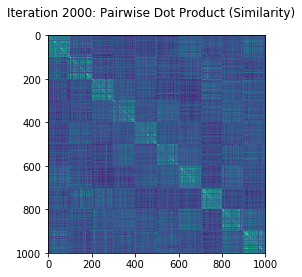

In [21]:
import matplotlib.pyplot as plt
fig = plt.figure()
fig.suptitle("Iteration 2000: Pairwise Dot Product (Similarity)")
plt.imshow(similarity)

In [15]:
from tools.analyzer import Distance
import tools.analyzer as ana

def get_similarity(train_step, model_checkpoint, dist_func):
    
    with tf.Session(graph=graph) as sess:
        
        saver = tf.train.Saver()
        saver.restore(sess, model_checkpoint + "-" + str(train_step))
        
        sess.run(unsup_it.initializer)
        labels_, embedded_sup = sess.run([t_sup_labels, t_sup_emb])
        embedded_unsup = sess.run(t_unsup_emb)
        
    similarity = ana.get_pairwise_distance(
        embedded_sup, 
        dist_func
    )
    return similarity
    
dist_func = Distance.l2
similarities = []
labels = []
similarities.append(get_similarity(2001, log_dir, dist_func))
labels.append(2001)
similarities.append(get_similarity(4001, log_dir, dist_func))
labels.append(4001)
# similarities.append(get_similarity(1000, log_dir, dist_func))
# labels.append(1000)
# similarities.append(get_similarity(2000, log_dir, dist_func))
# labels.append(2000)

INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-2001
INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-4001


In [16]:
similarities[0].shape

(1000, 1000)

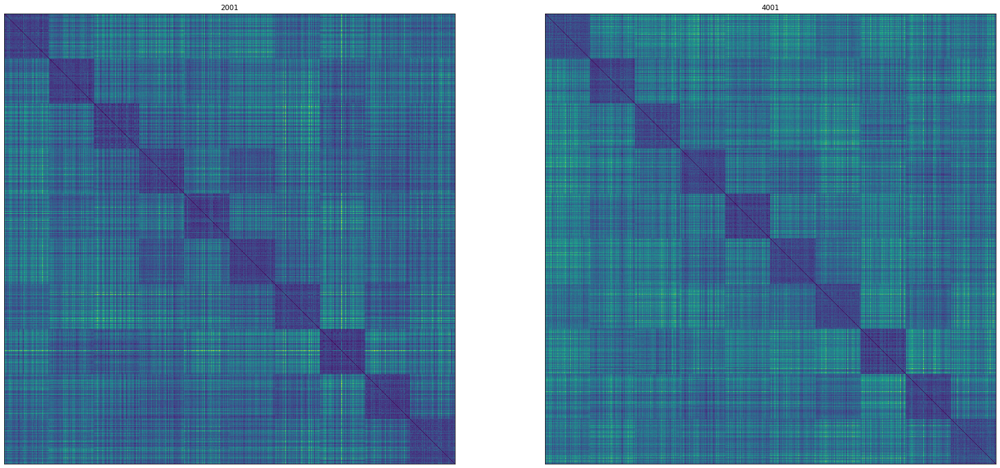

In [18]:
vis.imshow(similarities, figsize=(30,30), num_row=2,hspace=0, labels=labels, imgwidth=1000)

In [31]:
with tf.Session(graph=graph) as sess:
        
    saver = tf.train.Saver()
    saver.restore(sess, log_dir + "-" + str(train_step))
    
    sess.run(unsup_it.initializer)
    labels_, embedded_sup = sess.run([t_sup_labels, t_sup_emb])
    
    unsup_img, unsup_label, embedded_unsup = sess.run([t_unsup_images, t_unsup_labels, t_unsup_emb])
    
    stacked = np.vstack((embedded_sup, embedded_unsup))

INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-2001


In [26]:
from tools.analyzer import Distance
import tools.analyzer as ana

def get_embedded(train_step, model_checkpoint):
    with tf.Session(graph=graph) as sess:
        
        saver = tf.train.Saver()
        saver.restore(sess, model_checkpoint + "-" + str(train_step))
        
        sess.run(unsup_it.initializer)
        labels_, embedded_sup, unsup_img, unsup_label, embedded_unsup = sess.run(
            [t_sup_labels, t_sup_emb]+ [t_unsup_images, t_unsup_labels, t_unsup_emb]
        )
    
    stacked = np.vstack((embedded_sup, embedded_unsup[unsup_label.argsort()]))
        
    return stacked

def get_similarity(stacked, dist_func):
    
    similarity = ana.get_pairwise_distance(
        stacked, 
        dist_func
    )
    return similarity

def retrieve_similarity(train_step, model_checkpoint, dist_func):
    stacked = get_embedded(train_step, model_checkpoint)   
    return get_similarity(stacked, dist_func)
    
dist_func = Distance.l1
similarities = []
labels = []
similarities.append(retrieve_similarity(1, log_dir, dist_func))
labels.append(1)
similarities.append(retrieve_similarity(4001, log_dir, dist_func))
labels.append(4001)
# similarities.append(retrieve_similarity(1000, log_dir, dist_func))
# labels.append(1000)
# similarities.append(retrieve_similarity(2000, log_dir, dist_func))
# labels.append(2000)

INFO:tensorflow:Restoring parameters from logs/svhn-mnist/model-svhn-mnist-visit-1
INFO:tensorflow:Restoring parameters from logs/svhn-mnist/model-svhn-mnist-visit-4001


In [27]:
similarities[0].shape

(2000, 2000)

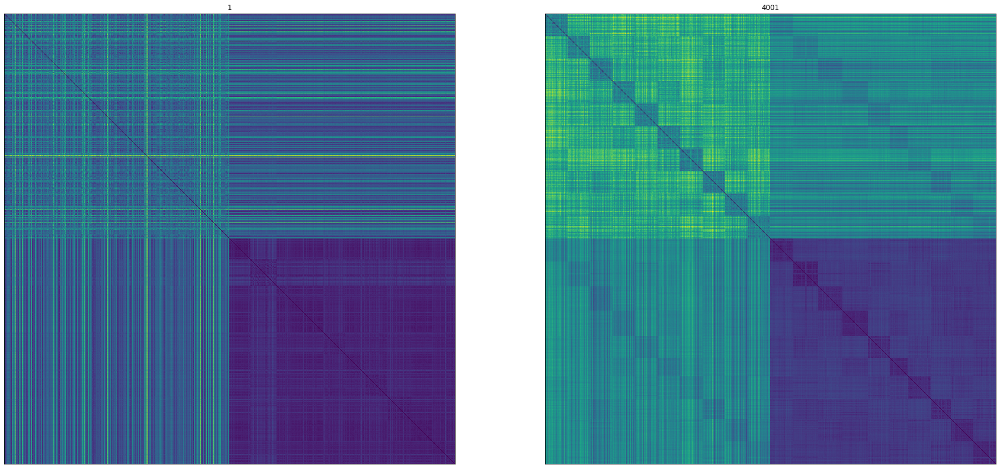

In [28]:
vis.imshow(similarities, figsize=(30,30), num_row=2,hspace=0, labels=labels, imgwidth=2000)

In [39]:
dist_func = Distance.l2
similarities = []
labels = []
similarities.append(retrieve_similarity(2001, log_dir, dist_func))
labels.append(2001)
similarities.append(retrieve_similarity(4001, log_dir, dist_func))
labels.append(4001)
similarities.append(retrieve_similarity(6001, log_dir, dist_func))
labels.append(6001)

INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-2001
INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-4001
INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-6001


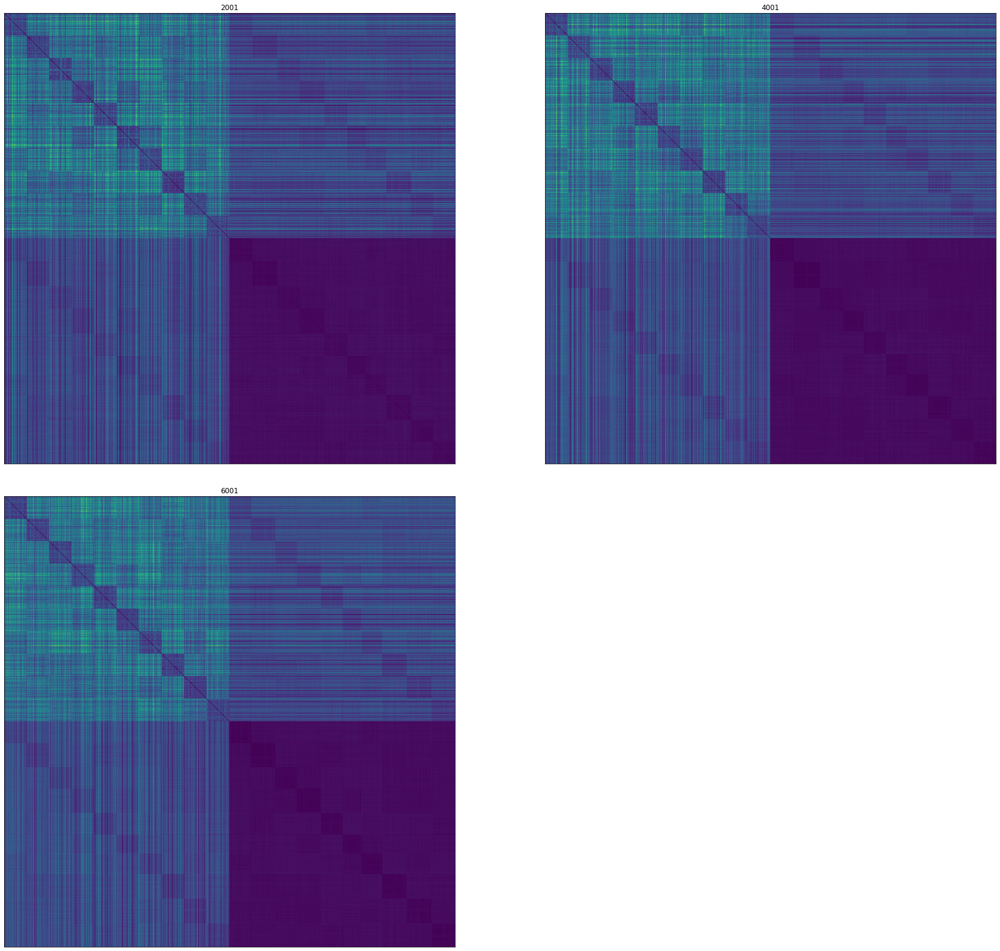

In [40]:
vis.imshow(similarities, figsize=(30,30), num_row=2,hspace=0, labels=labels, imgwidth=2000)

In [42]:
from ipywidgets import FloatSlider
from IPython.html.widgets import *

stacked100 = get_embedded(2001, log_dir)
stacked2000 = get_embedded(6001, log_dir)

interact(
    lambda sigma: vis.imshow(
        [
            get_similarity(stacked100, Distance.get_gaussian_k(sigma)),
            get_similarity(stacked2000, Distance.get_gaussian_k(sigma)),
        ], figsize=(50,50), hspace=0.05, labels=[2001,6001], imgwidth=2000
    ),
    sigma = FloatSlider(
        value=1,
        min=0.5,
        max=10.0,
        step=0.1,
        description='Effect of Gaussian Kernel',
        continuous_update=False,
        orientation='horizontal',
        readout=True,
        readout_format='.1f',
    )
)

INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-2001


/home/frankzl/.envs/env36-ml/.venv/lib/python3.6/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


INFO:tensorflow:Restoring parameters from logs/model-svhn-mnist-visit-6001


interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='Effect of Gaussian Kernel',…

<function __main__.<lambda>(sigma)>

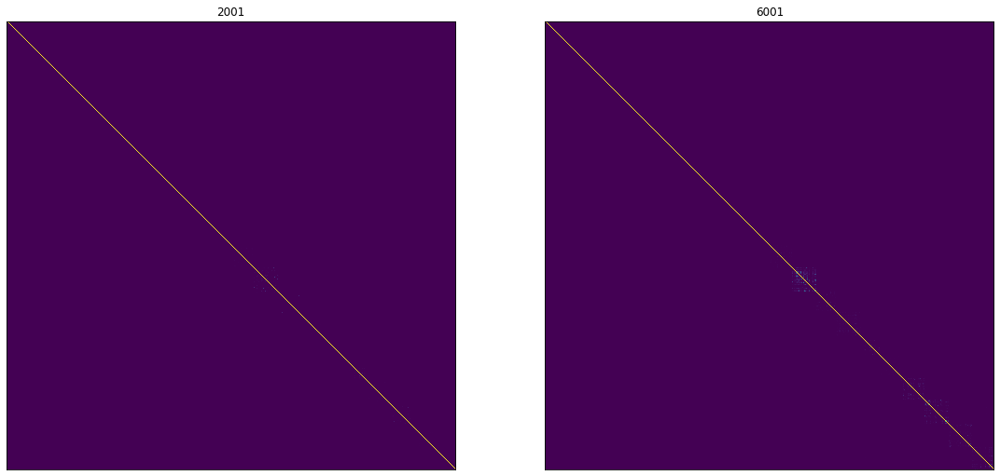

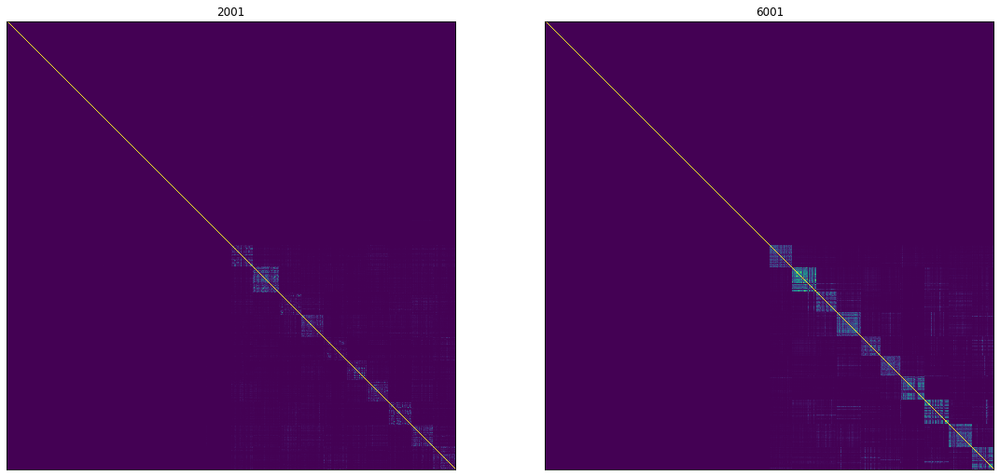

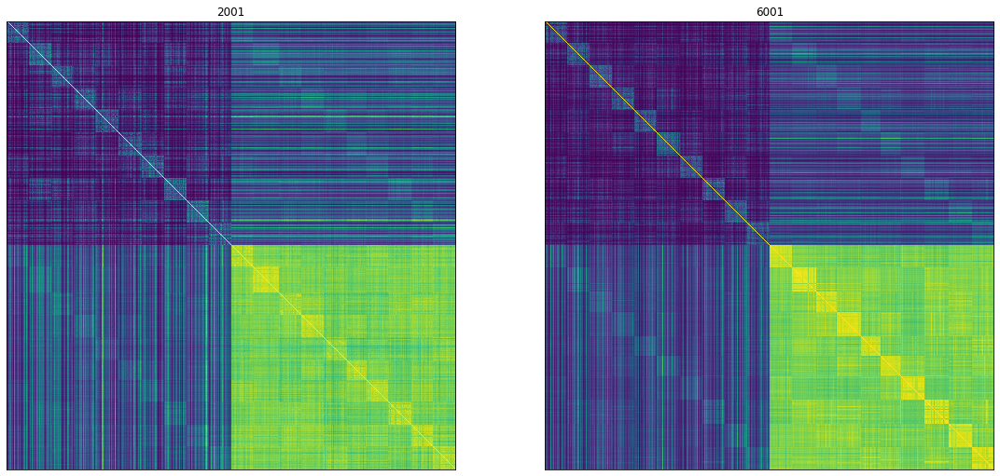

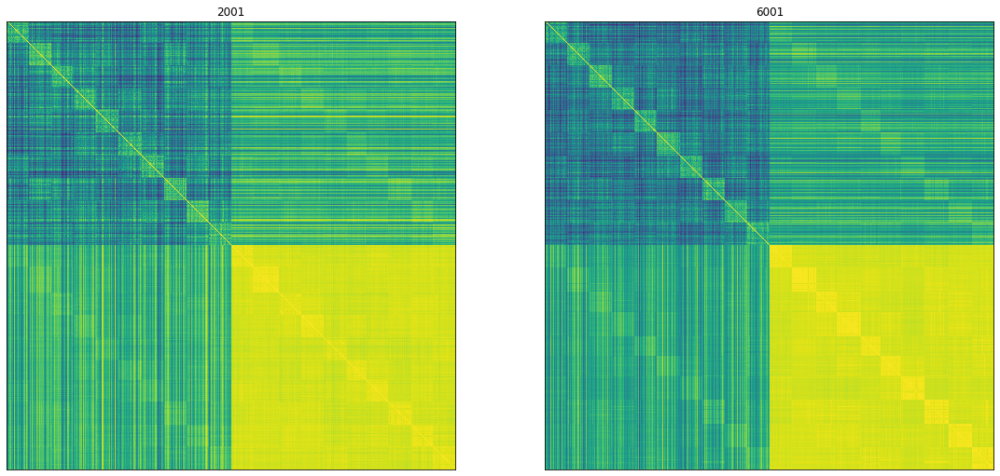

In [43]:
sigmas = [0.5, 1, 5, 10]

for sigma in sigmas:
    vis.imshow([get_similarity(stacked100, Distance.get_gaussian_k(sigma)),
                get_similarity(stacked2000, Distance.get_gaussian_k(sigma))
               ],figsize=(50,50), hspace=0.05, labels=[2001,6001], imgwidth=2000)